# EDA - Análise Exploratória de Dados 

In [1]:
import pandas as pd

### Carregando dados e anlisando tipo dos dados e colunas que tem

In [2]:
df_house_prices = pd.read_csv('arq/raw/house_prices.csv')

In [3]:
df_house_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

Obs: 
- O datase possue 21613 linhas e olhando pelo info todas as colunas estão com valores, a príncipio não tem valor nulo.  
- O tipo dos valores:
    - Tem que transformar a coluna date em ano, mês e dia.
    - Transformar a coluna floors em int. 


In [4]:
#Analisando algumas amostras do DataSet 
df_house_prices.sample(3)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
3070,1454600038,20150323T000000,985000.0,5,3.5,3890,13261,2.0,0,1,...,9,2870,1020,1984,0,98125,47.7246,-122.284,3080,13261
2971,7283900153,20150407T000000,400000.0,3,1.0,1060,12000,1.0,0,0,...,7,1060,0,1952,0,98133,47.7703,-122.350,1550,10500
13683,2024089011,20140826T000000,550000.0,5,1.0,2150,262231,1.5,0,0,...,7,2150,0,1900,2000,98065,47.5519,-121.803,1460,46609


## Indentificação das colunas 
Tabela com as colunas do arquivo `house_prices.csv` e a descrição do que cada coluna representa:

| Coluna          | Descrição                                                                 |
|-----------------|--------------------------------------------------------------------------|
| `id`            | Identificação única da casa                                              |
| `date`          | Data da venda da casa                                                    |
| `price`         | Preço de venda da casa                                                   |
| `bedrooms`      | Número de quartos na casa                                                |
| `bathrooms`     | Número de banheiros na casa                                              |
| `sqft_living`   | Área útil da casa em pés quadrados                                       |
| `sqft_lot`      | Tamanho do lote em pés quadrados                                         |
| `floors`        | Número de andares na casa                                                |
| `waterfront`    | Indicador se a casa tem vista para a água (0 = não, 1 = sim)             |
| `view`          | Índice de qualidade da vista (0-4)                                       |
| `condition`     | Índice de condição da casa (1-5)                                         |
| `grade`         | Índice de qualidade de construção e design da casa (1-13)                |
| `sqft_above`    | Área útil acima do solo em pés quadrados                                 |
| `sqft_basement` | Área útil no porão em pés quadrados                                      |
| `yr_built`      | Ano de construção da casa                                                |
| `yr_renovated`  | Ano de renovação da casa                                                 |
| `zipcode`       | Código postal da localização da casa                                     |
| `lat`           | Latitude da localização da casa                                          |
| `long`          | Longitude da localização da casa                                         |
| `sqft_living15` | Área útil das casas vizinhas em pés quadrados (média dos últimos 15 anos)|
| `sqft_lot15`    | Tamanho do lote das casas vizinhas em pés quadrados (média dos últimos 15 anos)|

## Convertendo as coluna date em três colunas dia, mês e ano

In [5]:
# Transforma a coluna date em datetime
df_house_prices['date'] = pd.to_datetime(df_house_prices['date'], format='%Y%m%dT%H%M%S')

In [6]:
df_house_prices['date'].head()

0   2014-10-13
1   2014-12-09
2   2015-02-25
3   2014-12-09
4   2015-02-18
Name: date, dtype: datetime64[ns]

In [7]:
df_house_prices['ano'] = df_house_prices['date'].dt.year
df_house_prices['mes'] = df_house_prices['date'].dt.month
df_house_prices['dia'] = df_house_prices['date'].dt.day

In [8]:
df_house_prices[['date', 'ano', 'mes', 'dia']].head()

,date,ano,mes,dia
0,2014-10-13,2014,10,13
1,2014-12-09,2014,12,9
2,2015-02-25,2015,2,25
3,2014-12-09,2014,12,9
4,2015-02-18,2015,2,18


## Transformando a coluna floors de float para int

In [9]:
# Convertendo a coluna 'floors' para inteiro
df_house_prices['floors'] = df_house_prices['floors'].astype(int)

In [10]:
df_house_prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  int64         
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         
 12  sqft_above     21613 non-null  int64         
 13  sqft_basement  21613 non-null  int64         
 14  yr_built       21613 non-null  int64         
 15  yr_renovated   2161

OBS: Acho que agora está bom o dataset

## Analisando a distribuição dos valores

In [11]:
df_house_prices.describe()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,ano,mes,dia
count,2.161300e+04,21613,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,...,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,2014-10-29 04:38:01.959931648,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.446213,0.007542,0.234303,...,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652,2014.322954,6.574423,15.688197
min,1.000102e+06,2014-05-02 00:00:00,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,...,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000,2014.000000,1.000000,1.000000
25%,2.123049e+09,2014-07-22 00:00:00,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,...,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000,2014.000000,4.000000,8.000000
50%,3.904930e+09,2014-10-16 00:00:00,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.000000,0.000000,0.000000,...,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000,2014.000000,6.000000,16.000000
75%,7.308900e+09,2015-02-17 00:00:00,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,...,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000,2015.000000,9.000000,23.000000
max,9.900000e+09,2015-05-27 00:00:00,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.000000,1.000000,4.000000,...,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000,2015.000000,12.000000,31.000000
std,2.876566e+09,NaN,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.551894,0.086517,0.766318,...,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631,0.467616,3.115308,8.635063


## Criando um mapa de box plot para ver a distribuição dos dados, enxergar o padrão de cada coluna e os outliers

In [12]:
# Selecionar colunas numéricas inteiras
numeric_cols = df_house_prices.select_dtypes(include=['int64']).columns

In [13]:
numeric_cols

Index(['id', 'bedrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront',
       'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built',
       'yr_renovated', 'zipcode', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

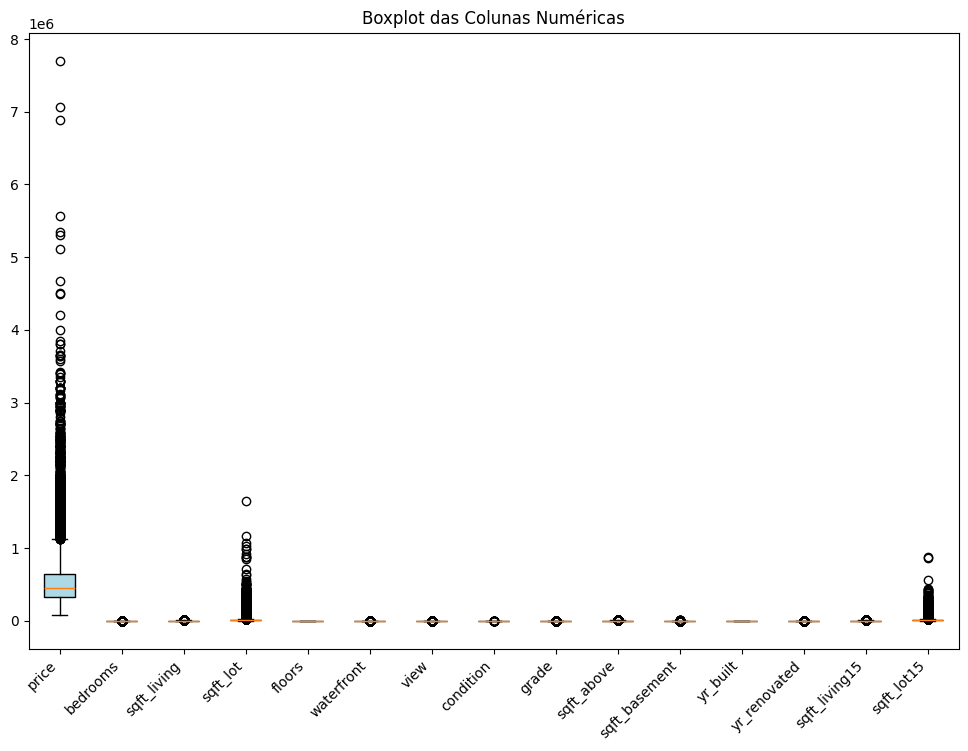

In [14]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

cols_to_plot = ['price',
    'bedrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront',
    'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 
    'yr_built', 'yr_renovated', 'sqft_living15', 'sqft_lot15'
]


# Criar o boxplot dos preços dos imóveis
plt.figure(figsize=(12, 8))
plt.boxplot(df_house_prices[cols_to_plot], vert=True, patch_artist=True, boxprops=dict(facecolor='lightblue'))
# Definir os rótulos do eixo x
plt.xticks(ticks=range(1, len(cols_to_plot) + 1), labels=cols_to_plot, rotation=45, ha='right')
plt.title('Boxplot das Colunas Numéricas')
plt.show()

Obs: Analisar todas as colunas numéricas juntas é complicado pq os escala de uma coluna atrapalha na outra, vamos separa os gráficos para entender um pouco melhora cada coluna

In [15]:
def millions(x, pos):
    return '%1.0f' % (x / 1000000)

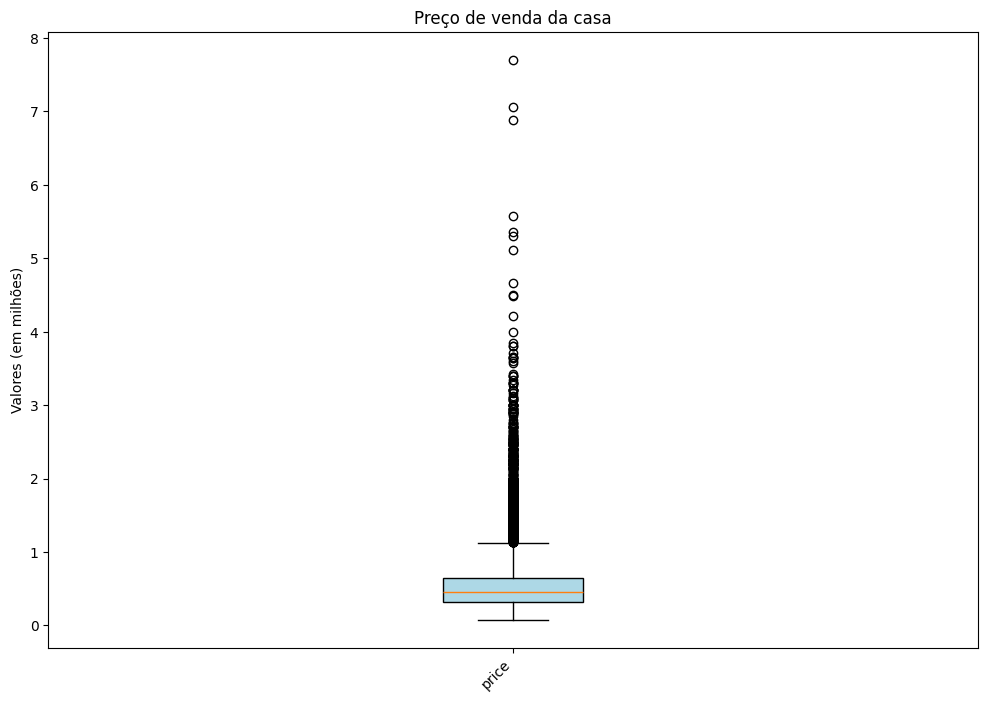

In [16]:
cols_to_plot = ['price']


# Criar o boxplot dos preços dos imóveis
plt.figure(figsize=(12, 8))
plt.boxplot(df_house_prices[cols_to_plot], vert=True, patch_artist=True, boxprops=dict(facecolor='lightblue'))
# Definir os rótulos do eixo x
plt.xticks(ticks=range(1, len(cols_to_plot) + 1), labels=cols_to_plot, rotation=45, ha='right')

formatter = FuncFormatter(millions)
plt.gca().yaxis.set_major_formatter(formatter)
plt.ylabel('Valores (em milhões)')
plt.title('Preço de venda da casa')
plt.show()

OBS:
- A maioria dos preços de venda das casas está abaixo de 1 milhão.
- Há uma grande quantidade de outliers acima de 1 milhão, chegando até cerca de 8 milhões, indicando que há algumas casas com preços muito mais altos que a maioria.
- A mediana do preço das casas está um pouco acima de 500 mil.

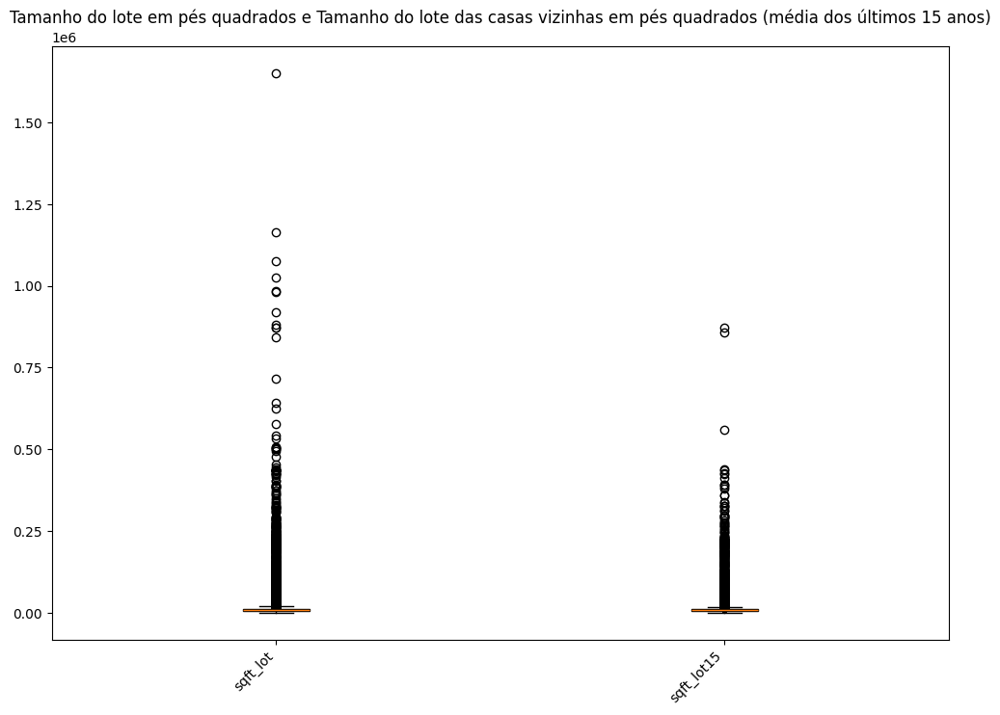

In [17]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

cols_to_plot = ['sqft_lot', 'sqft_lot15']


# Criar o boxplot dos preços dos imóveis
plt.figure(figsize=(12, 8))
plt.boxplot(df_house_prices[cols_to_plot], vert=True, patch_artist=True, boxprops=dict(facecolor='lightblue'))
# Definir os rótulos do eixo x
plt.xticks(ticks=range(1, len(cols_to_plot) + 1), labels=cols_to_plot, rotation=45, ha='right')


plt.title('Tamanho do lote em pés quadrados e Tamanho do lote das casas vizinhas em pés quadrados (média dos últimos 15 anos)')
plt.show()

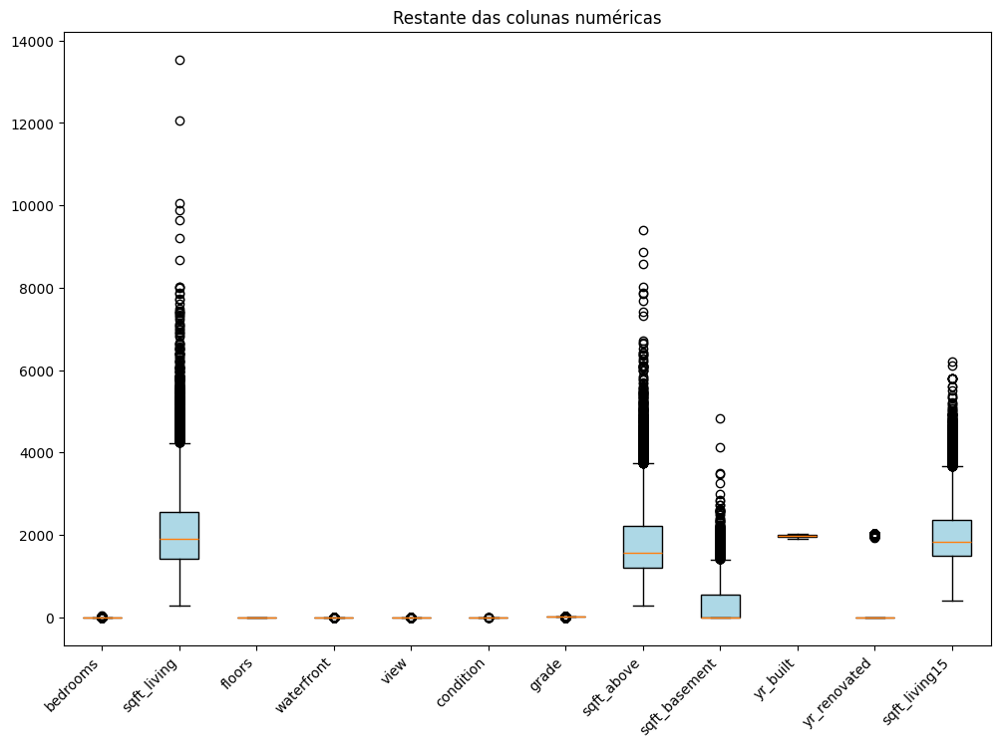

In [18]:
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

cols_to_plot = [
    'bedrooms', 'sqft_living', 'floors', 'waterfront',
    'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 
    'yr_built', 'yr_renovated', 'sqft_living15'
]


# Criar o boxplot dos preços dos imóveis
plt.figure(figsize=(12, 8))
plt.boxplot(df_house_prices[cols_to_plot], vert=True, patch_artist=True, boxprops=dict(facecolor='lightblue'))
# Definir os rótulos do eixo x
plt.xticks(ticks=range(1, len(cols_to_plot) + 1), labels=cols_to_plot, rotation=45, ha='right')

plt.title("Restante das colunas numéricas")
plt.show()

## Análisando a distribuição geográfica das casas

In [19]:
# Bibliotecas necessáris para a análise geoespacial
import geopandas as gpd
from shapely import Point

In [20]:
# Cria uma coluna geometry com o ponto de cada imóvel com base no lat e long
df_house_prices['geometry'] = df_house_prices[['lat', 'long']].apply(lambda x: Point(x['long'], x['lat']), axis=1)

In [21]:
# Transforma o DataFrame em um GeoDataFrame, o GeoDataFrame ajuda com a análise geoespacial
gdf_house_prices = gpd.GeoDataFrame(df_house_prices, geometry='geometry', crs='EPSG:4326')

<Axes: >

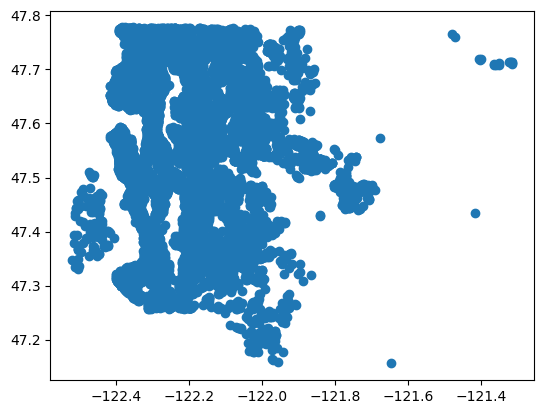

In [22]:
# Plota o mapa com os imóveis só para ter um prévia dos dados
gdf_house_prices.plot()

## Visualização de Imóveis em um Mapa

In [23]:
import matplotlib.pyplot as plt
import contextily as ctx

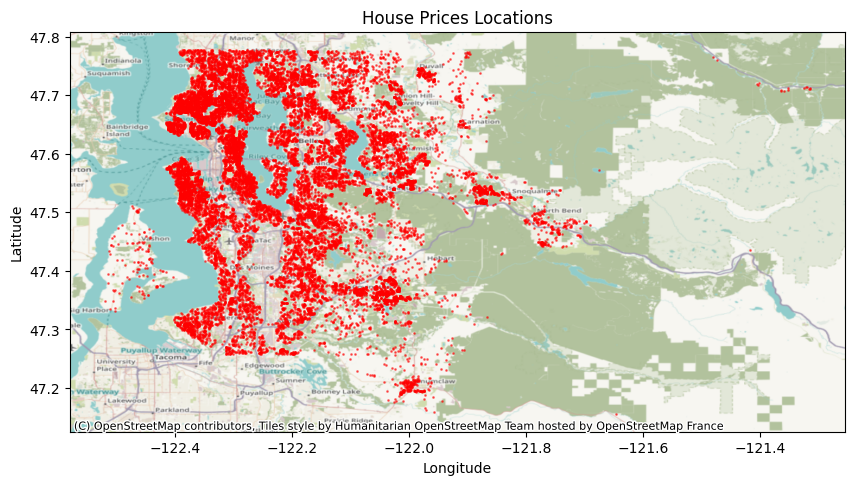

In [24]:
# Plotar os pontos no mapa usando Matplotlib e Contextily
fig, ax = plt.subplots(figsize=(10, 10))
gdf_house_prices.plot(ax=ax, marker='o', color='red', markersize=1, alpha=0.5)
ctx.add_basemap(ax, crs=4326)
plt.title('House Prices Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [25]:
import folium
from folium import GeoJson
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


In [26]:
vmin = gdf_house_prices['price'].min()
vmax = gdf_house_prices['price'].quantile(0.75)

def price_to_color(value, cmap_name='turbo'):
    cmap = plt.get_cmap(cmap_name)  # Obtém o mapa de cores
    norm = plt.Normalize(vmin, vmax)  # Normaliza o valor para o intervalo 0-1
    rgba = cmap(norm(value))  # Retorna a cor correspondente ao valor em RGBA
    return mcolors.to_hex(rgba)  # Converte a cor RGBA para hexadecimal


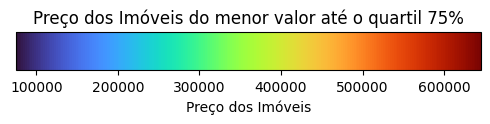

In [27]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np


# Criar uma imagem vazia apenas para a colorbar
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cmap = plt.get_cmap('turbo') # Obtém o mapa de cores
norm = plt.Normalize(vmin, vmax)  # Normaliza o valor para o intervalo 0-1
# Criar uma ColorbarBase com a normalização e colormap definidos
cbar = plt.colorbar(
    plt.cm.ScalarMappable(norm=norm, cmap=cmap),
    cax=ax,
    orientation='horizontal'
)

# Adicionar título e rótulos
cbar.set_label('Preço dos Imóveis')

plt.title('Preço dos Imóveis do menor valor até o quartil 75%')
# Salvar a colorbar em um arquivo de imagem
#plt.savefig('colorbar.png')
plt.show()

## Criando um mapa com a distribuição de todas as casas

In [28]:
centro_mapa = gdf_house_prices.geometry.unary_union.centroid

m = folium.Map(location=[centro_mapa.y, centro_mapa.x], zoom_start=10)

# Adicionar os pontos do GeoDataFrame ao mapa
for _, row in gdf_house_prices.iterrows():
    color = price_to_color(row.price)
    folium.Circle(
        location=[row.geometry.y, row.geometry.x],
        radius=100,  # raio do círculo em metros
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        weight=0 
        #popup=f'Preço: {row.price}'
    ).add_to(m)

# Salvar o mapa em um arquivo HTML
m.save('arq/mapa/Mapa_Todos_Imóveis.html')
m

## Análisando a distribuição das casas que valem mais que 1 milhão 

In [29]:
gdf_house_prices_quantile_75 = gdf_house_prices.loc[gdf_house_prices['price'] > 1000000]
len(gdf_house_prices_quantile_75)

1465

Obs: De 21613 casas, 1465 estão com o price acima de 1M

In [30]:
gdf_house_prices_quantile_75['price'].min() 

np.float64(1000750.0)

In [31]:
gdf_house_prices_quantile_75['price'].max()

np.float64(7700000.0)

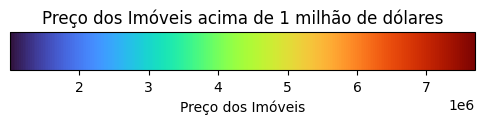

In [32]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

vmin = gdf_house_prices_quantile_75['price'].min()
vmax = gdf_house_prices_quantile_75['price'].max()

# Criar uma imagem vazia apenas para a colorbar
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.5)

cmap = plt.get_cmap('turbo') # Obtém o mapa de cores
norm = plt.Normalize(vmin, vmax)  # Normaliza o valor para o intervalo 0-1
# Criar uma ColorbarBase com a normalização e colormap definidos
cbar = plt.colorbar(
    plt.cm.ScalarMappable(norm=norm, cmap=cmap),
    cax=ax,
    orientation='horizontal'
)

# Adicionar título e rótulos
cbar.set_label('Preço dos Imóveis')

plt.title('Preço dos Imóveis acima de 1 milhão de dólares')
# Salvar a colorbar em um arquivo de imagem
#plt.savefig('colorbar.png')
plt.show()

In [33]:
vmin = gdf_house_prices_quantile_75['price'].min()
vmax = gdf_house_prices_quantile_75['price'].max()

def price_to_color(value, cmap_name='turbo'):
    cmap = plt.get_cmap(cmap_name).reversed()  # Obtém o mapa de cores
    norm = plt.Normalize(vmin, vmax)  # Normaliza o valor para o intervalo 0-1
    rgba = cmap(norm(value))  # Retorna a cor correspondente ao valor em RGBA
    return mcolors.to_hex(rgba)  # Converte a cor RGBA para hexadecimal


In [34]:
centro_mapa = gdf_house_prices.geometry.unary_union.centroid

m = folium.Map(location=[centro_mapa.y, centro_mapa.x], zoom_start=10)

# Adicionar os pontos do GeoDataFrame ao mapa
for _, row in gdf_house_prices_quantile_75.iterrows():
    color = price_to_color(row.price)
    folium.Circle(
        location=[row.geometry.y, row.geometry.x],
        radius=100,  # raio do círculo em metros
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        weight=0 ,
        popup=f'Preço: {row.price}'
    ).add_to(m)

# Salvar o mapa em um arquivo HTML
m.save('arq/mapa/Mapa_Imóveis_Acima_de_1M.html')
m